In [1]:
import os
os.chdir('..')
from lib.includes import *

Using TensorFlow backend.


In [1]:
# using venv

## A few words to introduction
I had a lot of thoughts concerning this task implementation,
so 90 percent was rejected or not managed to complete
Therefore there'll be a few of these thoughts in my decision.

Mainly, this approach is up to original notebook and usage of
Mask rcnn for object segmentation. It appears to be really effective,

but..

I feel bad trying to manage the interface

So, now, at night, me trying to train more rcnn on collab with other params, manually changing 1 param each time, while have a time to write all this and to put messy notebook in order.

Maybe, for the morning, when learning stops, score'll be even more than 0.85.
Moreover, I haven't tried augmentation yet.

And, by the way, I can attach links to some sources I read. Though, actually, it's quite a waste of time.

### Web
$\square$ https://www.analyticsvidhya.com/blog/2019/07/computer-vision-implementing-mask-r-cnn-image-segmentation/
https://www.kaggle.com/hmendonca/mask-rcnn-and-coco-transfer-learning-lb-0-155

$\square$ https://www.kaggle.com/hmendonca/mask-rcnn-and-coco-transfer-learning-lb-0-155

$\square$ https://www.pyimagesearch.com/2019/06/10/keras-mask-r-cnn/

$\square$ https://habr.com/ru/company/intel/blog/266347/

$\square$ https://pythonprogramming.net/grabcut-foreground-extraction-python-opencv-tutorial/

$\square$ https://www.immersivelimit.com/tutorials/using-mask-r-cnn-on-custom-coco-like-dataset - $\textbf {original author}$

$\square$ https://www.pyimagesearch.com/2015/11/02/watershed-opencv/

$\square$ https://www.kaggle.com/abhishek/mask-rcnn-with-augmentation-and-multiple-masks

$\square$ https://www.pyimagesearch.com/2018/11/19/mask-r-cnn-with-opencv/

(stackoverflow)

### Book
$\square$ Deep Learning with Python - Choilet

Now, to the work

Fail attempts will be after best

### Load data, set paths

### $\circ$ train
load only 20 of train, it's heavy, just to look up

In [2]:
from lib import *
images = "data/cig_butts/train/images/"
img, masks, annotations = load_train(images)

100%|██████████| 20/20 [00:00<00:00, 1124.69it/s]

loaded train to img, masks (20, 512, 512, 3)


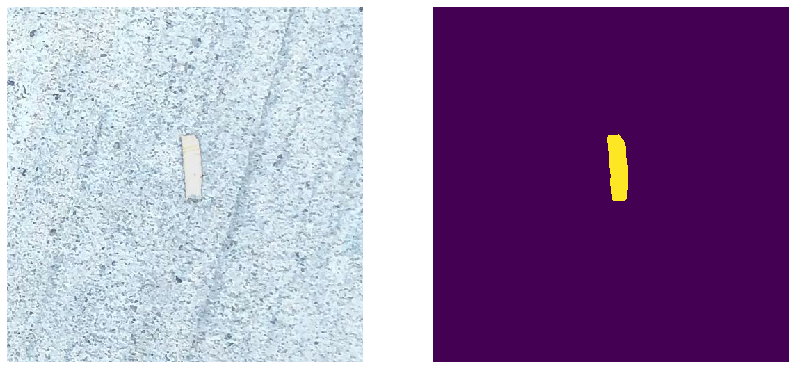

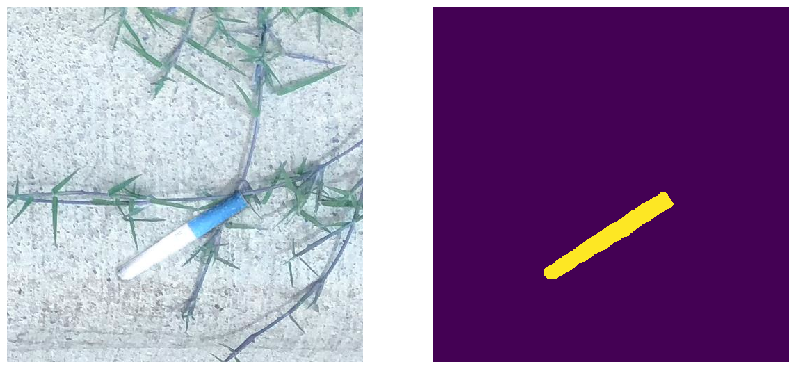

In [3]:
# just looking what data it is
show_img_with_mask(img[4], masks[4])
show_img_with_mask(img[19], masks[19])

In [8]:
annotations_df.head(3)  # all images in json are (512, 512) 

,width,height,id
file_name,,,
00000000.jpg,512,512,0
00000001.jpg,512,512,1
00000002.jpg,512,512,2


### $\circ$ validation

In [82]:
val_images = "data/cig_butts/val/images/"
val_img, val_masks, annotations = load_val(val_images)












  0%|          | 0/200 [00:00<?, ?it/s]










  4%|▍         | 8/200 [00:00<00:02, 75.04it/s]










  9%|▉         | 18/200 [00:00<00:02, 80.20it/s]










 14%|█▍        | 28/200 [00:00<00:02, 83.25it/s]










 18%|█▊        | 37/200 [00:00<00:01, 83.05it/s]










 24%|██▎       | 47/200 [00:00<00:01, 85.33it/s]










 28%|██▊       | 55/200 [00:00<00:01, 81.78it/s]










 32%|███▏      | 64/200 [00:00<00:01, 82.11it/s]










 36%|███▋      | 73/200 [00:00<00:01, 82.87it/s]










 40%|████      | 81/200 [00:00<00:01, 80.26it/s]










 44%|████▍     | 89/200 [00:01<00:01, 73.35it/s]










 48%|████▊     | 97/200 [00:01<00:01, 67.80it/s]










 52%|█████▏    | 104/200 [00:01<00:01, 59.05it/s]










 56%|█████▌    | 111/200 [00:01<00:01, 52.10it/s]










 58%|█████▊    | 117/200 [00:01<00:01, 45.56it/s]










 61%|██████    | 122/200 [00:01<00:01, 43.91it/s]










 64%|██████▎   | 127/200 [00:02<00:01, 37.98it/s]



loaded val images to img, masks (200, 512, 512, 3)


In [64]:
annotations_df = pd.read_json(json.dumps(annotations.get('images'))).\
                    drop(['license', 'file_name'], axis=1).set_index('id')
annotations_df.head(2)

,width,height
id,,
0,512,512
1,512,512


### $\circ$ trained models validation, comparison
building df with dices of val pred

### load trained resn model

In [4]:
Mask_RCNN = 'Mask_RCNN/'
MODEL_DIR = os.path.join(Mask_RCNN, "mrcnn/logs")
TRAINED_MODEL = os.path.join(Mask_RCNN, "trained_weights/mask_rcnn_cig_butts_0008.h5")
load_best_model()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        100
DETECTION_MIN_CONFIDENCE       0.65
DETECTION_NMS_THRESHOLD        0.3
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            3
IMAGE_MAX_DIM                  512
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  512
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [512 512   3]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE            

This is the info is of best model. Scores of several of trained models were saved and ready to show to compare. 

In [5]:
class InferenceConfig(CocoSynthConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    IMAGE_MIN_DIM = 512
    IMAGE_MAX_DIM = 512
    DETECTION_MIN_CONFIDENCE = 0.95  # has 0.99 high confidence usualy
    

inference_config = InferenceConfig()

In [7]:
# Recreate the model in inference mode
rcnn_model = recreate_model(inference_config)

model_path = 'Mask_RCNN/logs/cocosynth_dataset20200219T2307/resn101epoch==8.h5'
# Load trained weights

print("Loading weights from ", model_path)
rcnn_model.load_weights(model_path, by_name=True)

Loading weights from  Mask_RCNN/logs/cocosynth_dataset20200219T2307/resn101epoch==8.h5


In [60]:
%%time
masks_pred_score = []                                              # was good widget
masks_pred_score = pred_masks_dices(rcnn_model, val_img, val_masks)  # what happened with %











0it [00:00, ?it/s]









1it [00:03,  3.04s/it]









2it [00:05,  2.92s/it]









3it [00:08,  2.87s/it]









4it [00:11,  2.86s/it]









5it [00:14,  2.98s/it]









6it [00:18,  3.31s/it]









7it [00:23,  3.71s/it]









8it [00:26,  3.66s/it]









9it [00:31,  3.82s/it]









10it [00:34,  3.68s/it]









11it [00:37,  3.41s/it]









12it [00:39,  3.25s/it]









13it [00:42,  3.08s/it]









14it [00:45,  3.14s/it]









15it [00:48,  3.04s/it]









16it [00:51,  2.95s/it]









17it [00:54,  2.86s/it]









18it [00:56,  2.81s/it]









19it [00:59,  2.82s/it]









20it [01:02,  2.79s/it]









21it [01:05,  2.76s/it]









22it [01:07,  2.74s/it]









23it [01:10,  2.84s/it]









24it [01:13,  2.80s/it]









25it [01:16,  2.79s/it]









26it [01:19,  2.80s/it]









27it [01:21,  2.79s/it]









28it [01:24,  2.79s/it]









29it [01:27,  2.82s/it]









30it [01:30,  

AssertionError: Types of true and pred should be the same.

In [62]:
# tmp = masks_pred_score
# masks_pred_score = np.array(list(masks_pred_score) + list(tmp)) # 19 100 160
len(masks_pred_score)
# len(tmp)
# len(masks_pred_score)  some of masks (1 or 2) are non valid, dont't see why
# it's kind of logs

197

In [65]:
# annotations_df.drop([19, 100, 160], inplace=True)
annotations_df['dice'] = masks_pred_score

### $\circ$ Validation comparison of some models

Would like to look at learning curves, but don't even know how to get history.

Found how, though it's too late.

In that way, we can investigate data in dices tables.

In [72]:
annotations_df_50 = pd.read_csv('data/cig_butts/val/resnet50_init.csv')
annotations_df_101 = pd.read_csv('data/cig_butts/val/resnet101_init.csv')
annotations_df_50['model'] = 'resn50'
annotations_df_101['model'] = 'resn101'
annotations_best = annotations_df
annotations_best['model'] = 'best'
annotations_df = pd.concat([annotations_df_50, annotations_df_101, annotations_best])

In [10]:
annotations_df_50.describe()

,id,dice
count,199.000000,199.000000
mean,99.185930,0.853447
std,57.854054,0.149758
min,0.000000,0.013373
25%,49.500000,0.833307
50%,99.000000,0.914867
75%,148.500000,0.937380
max,199.000000,0.973613


In [11]:
annotations_df_101.describe()

,id,dice
count,198.000000,198.000000
mean,99.353535,0.872944
std,57.772231,0.146802
min,0.000000,0.000000
25%,50.250000,0.891740
50%,99.500000,0.924420
75%,148.750000,0.941939
max,199.000000,0.974930


In [68]:
annotations_best.describe()

,width,height,dice
count,197.0,197.0,197.000000
mean,512.0,512.0,0.883819
std,0.0,0.0,0.145690
min,512.0,512.0,0.000000
25%,512.0,512.0,0.892708
50%,512.0,512.0,0.930868
75%,512.0,512.0,0.949381
max,512.0,512.0,0.973090


resnet 101 was better initially, so decided to tune 101 one further.
In general, there was much sense in:

epoch number

learning rate - 0.001 (so surprisingly)

confidence threshhold

weight decay (a little less important)

and lastly tried augmentation.

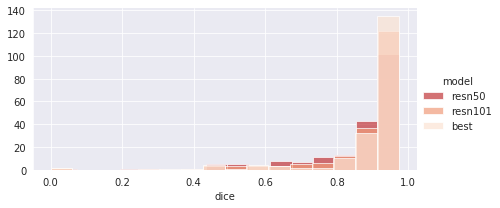

In [73]:
show_hist(annotations_df)

### $\circ$ test

In [158]:
test_images = "data/cig_butts/real_test/"
test_img = load_test(test_images)












  0%|          | 0/10 [00:00<?, ?it/s]










100%|██████████| 10/10 [00:00<00:00, 53.54it/s][A


Suddenly it crashes on test 3, don't know now why.

Remember it was ok.

All in all, there is visualize at the very bottom.

It it is the hardest image for segmentation.












  0%|          | 0/3 [00:00<?, ?it/s]

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32
CONFIDENCE_SCORE	 [0.9995914  0.99933016]


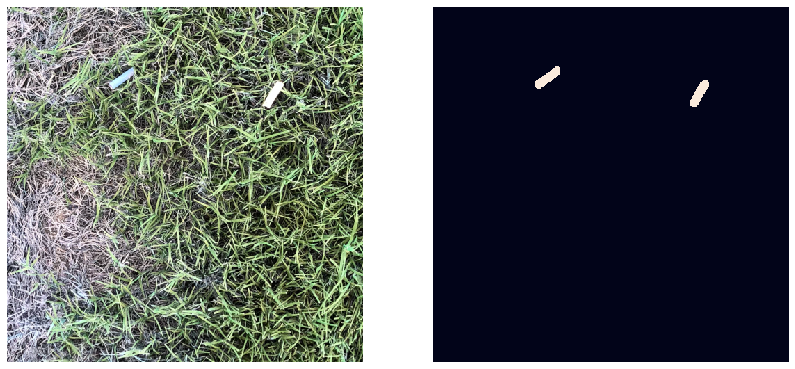












 33%|███▎      | 1/3 [00:03<00:07,  3.61s/it]

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32
CONFIDENCE_SCORE	 [0.9998596  0.9994986  0.9991879  0.9988519  0.9986526  0.99833006
 0.9928041  0.988499  ]


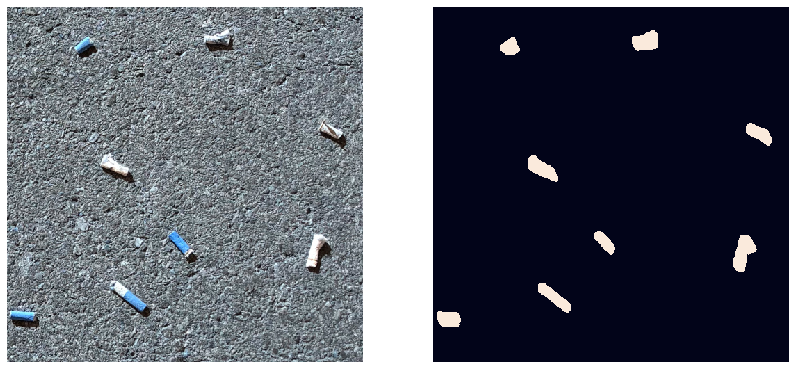












 67%|██████▋   | 2/3 [00:06<00:03,  3.49s/it]

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32
CONFIDENCE_SCORE	 [0.9981731  0.9981184  0.99600756 0.9892097  0.9737941 ]


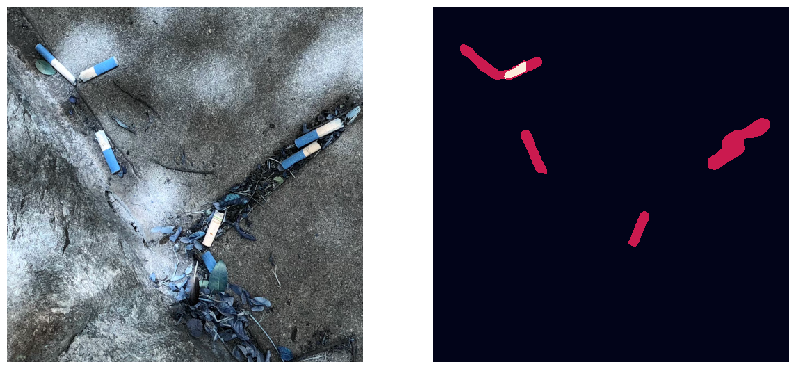












100%|██████████| 3/3 [00:10<00:00,  3.40s/it]


In [159]:
show_test_with_masks(rcnn_model, test_img[:3])












  0%|          | 0/6 [00:00<?, ?it/s]

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32
CONFIDENCE_SCORE	 [0.9995436]


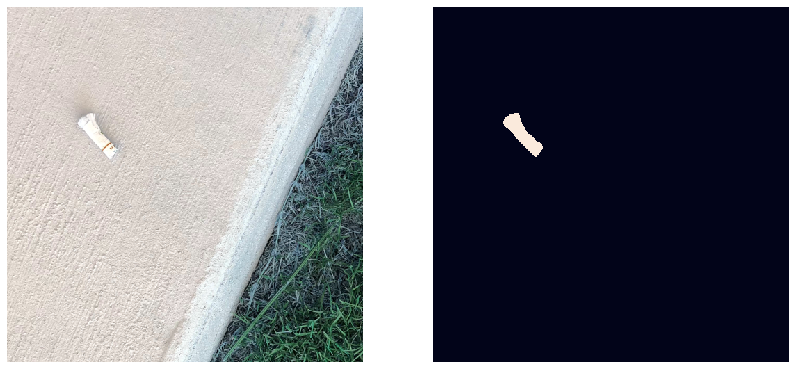












 17%|█▋        | 1/6 [00:03<00:19,  3.83s/it]

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32
CONFIDENCE_SCORE	 [0.9986475]


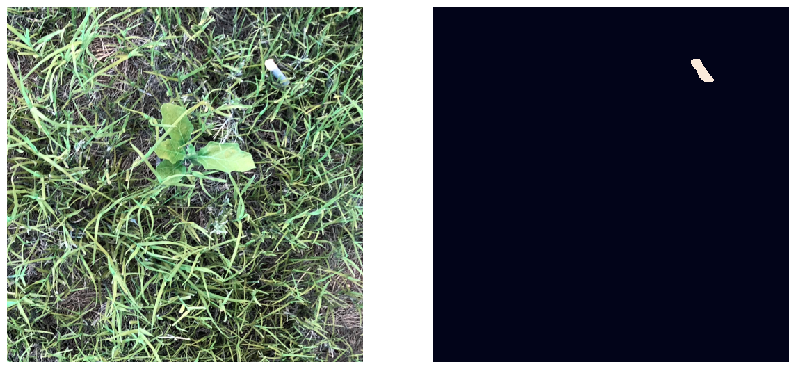












 33%|███▎      | 2/6 [00:07<00:14,  3.69s/it]

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32
CONFIDENCE_SCORE	 [0.9976392]


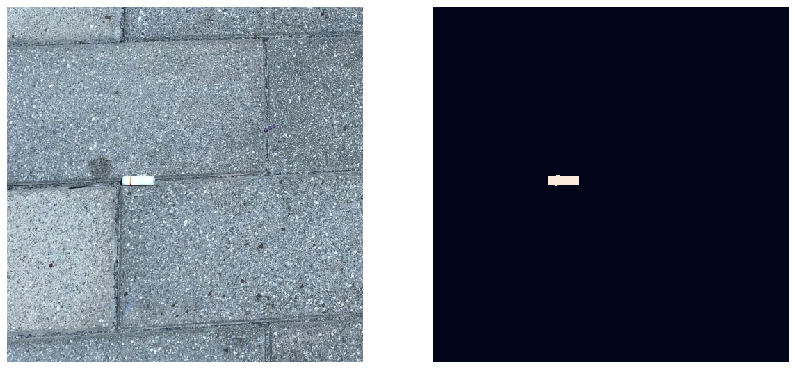












 50%|█████     | 3/6 [00:11<00:11,  3.80s/it]

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32
CONFIDENCE_SCORE	 [0.9979855]


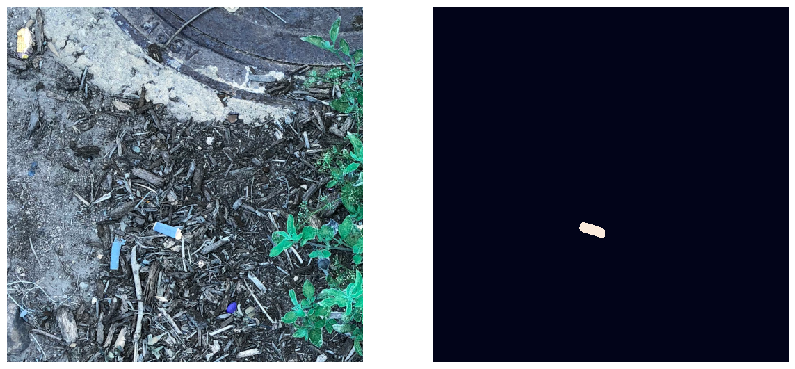












 67%|██████▋   | 4/6 [00:14<00:07,  3.78s/it]

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32
CONFIDENCE_SCORE	 [0.99979633 0.9905592 ]


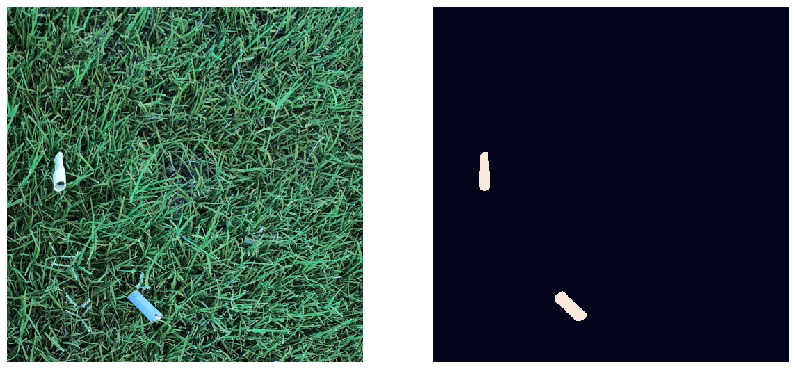












 83%|████████▎ | 5/6 [00:18<00:03,  3.78s/it]

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32
CONFIDENCE_SCORE	 [0.99997663 0.9987435  0.9798313 ]


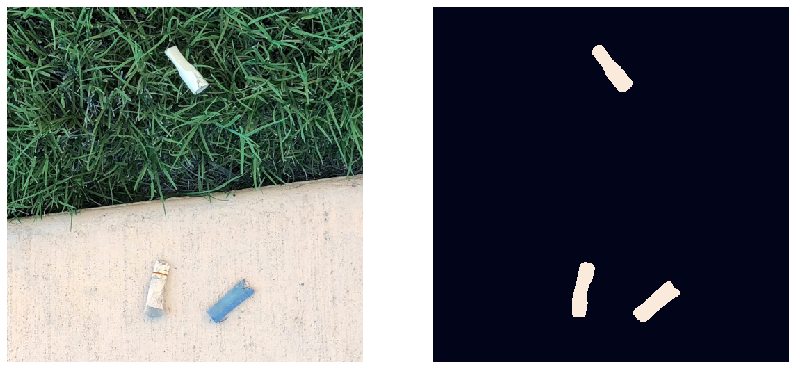












100%|██████████| 6/6 [00:22<00:00,  3.69s/it]


In [160]:
show_test_with_masks(rcnn_model, test_img[4:])

## It's hightime for submissions
And

Unfortunately, gdrive pushes data to my disk already for a while and it's not going to do it, presume.

So, I've done training with augmentation and it looks good, maybe better than this one, maybe not.

Anyway, I'll leave a link to google collab note, it's how I trained rcnn.

$\textbf{link - https://drive.google.com/file/d/1oOtWxi_JH2O4KjfjbFpOB_SblB_LhLKV/view}$

In [143]:
annotations_best['mask'] = pred_masks[:197]
annotations_best['mask'][:97] = annotations_best['mask'][:97].apply(encode_rle)  # again
annotations_best['mask'][98:] = annotations_best['mask'][98:].apply(encode_rle)  # numbers

In [147]:
# annotations_best.drop(98, inplace=True)
annotations_best.drop(['dice', 'model'], axis=1, inplace=True)
annotations_best.reset_index(inplace=True)
annotations_best.rename(columns={'id': 'img_id', 'mask': 'rle_mask'}, inplace=True)

In [151]:
!pwd

/home/argon/prog/AIapply


In [154]:
annotations_best.to_csv('data/pred_valid_template.csv')
pred_valid_template = pd.read_csv('data/pred_valid_template.csv')

In [83]:
def remove_rgb(mask):
    mask = np.sum([mask[:,:,i] for i in range(mask.shape[2])], axis=0)

    return mask

pred_masks = []
for img, mask in tqdm(zip(val_img[161:], val_masks[161:])):
    img_arr = np.array(img)
    results = rcnn_model.detect([img_arr])
    r = results[0]
    pred_mask = r['masks']
    pred_mask = remove_rgb(pred_mask)
    pred_masks.append(pred_mask)
    
pred_masks = np.array(pred_masks)












0it [00:00, ?it/s]










1it [00:03,  3.10s/it]










2it [00:05,  3.00s/it]










3it [00:08,  2.91s/it]










4it [00:11,  2.87s/it]










5it [00:14,  2.87s/it]










6it [00:16,  2.80s/it]










7it [00:19,  2.82s/it]










8it [00:22,  2.85s/it]










9it [00:25,  2.91s/it]










10it [00:28,  2.93s/it]










11it [00:31,  2.92s/it]










12it [00:35,  3.08s/it]










13it [00:37,  2.98s/it]










14it [00:40,  2.88s/it]










15it [00:43,  2.82s/it]










16it [00:45,  2.77s/it]










17it [00:48,  2.75s/it]










18it [00:51,  2.72s/it]










19it [00:53,  2.72s/it]










20it [00:56,  2.70s/it]










21it [00:59,  2.70s/it]










22it [01:01,  2.68s/it]










23it [01:04,  2.71s/it]










24it [01:07,  2.68s/it]










25it [01:09,  2.68s/it]










26it [01:12,  2.68s/it]










27it [01:15,  2.69s/it]










28it [01:18,  2.80s/it]










29it [01:21,  2.8

In [85]:
pred_masks = np.array(list(tmp) + list(pred_masks))

In [86]:
pred_masks.shape

(199,)

## THAT PART ISN'T READY YET

There are baseline of cv2.grabcut, tries of own model design, tries of implementing grabcut after nn output to get better result (it is worse).

Wanted to try watershed yet, but it's unnecessry suppose, as building top of keras.applications resnet50.

## just crop the img train
## is it GrabCut?

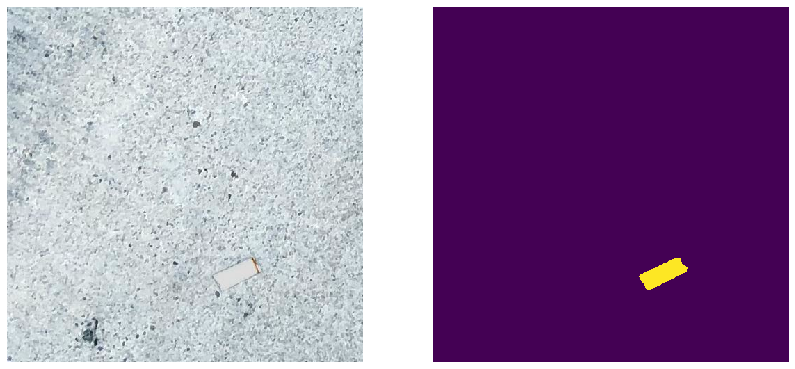

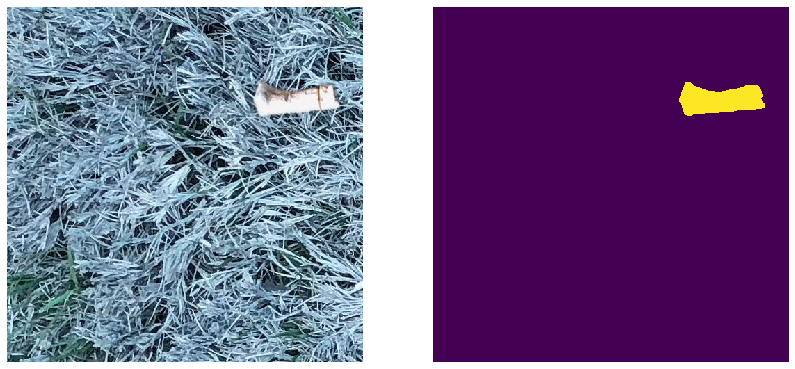

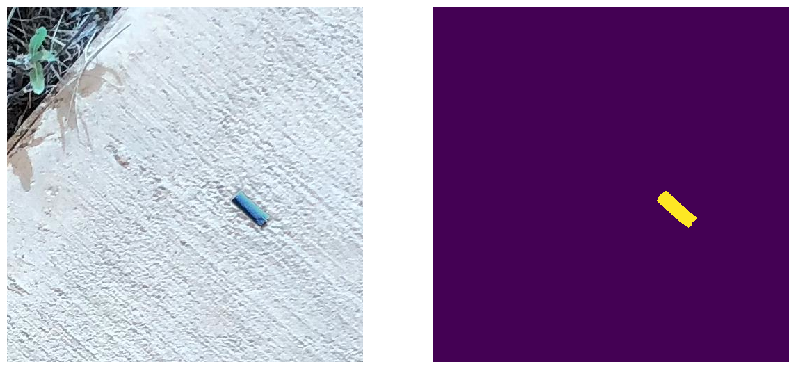

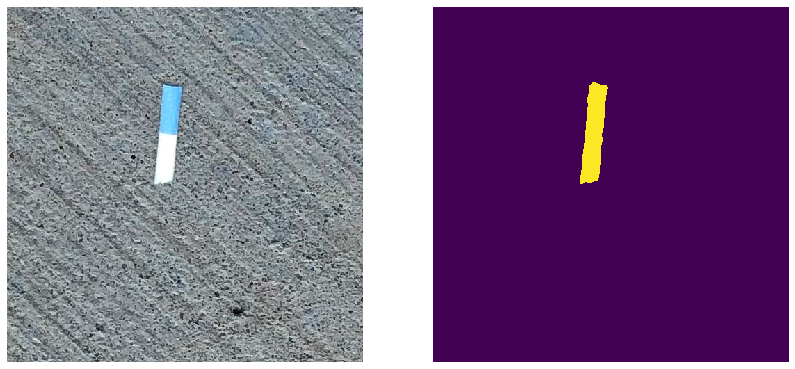

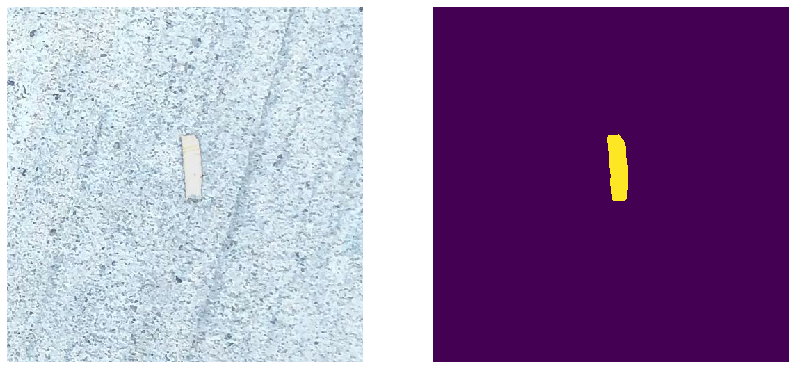

...

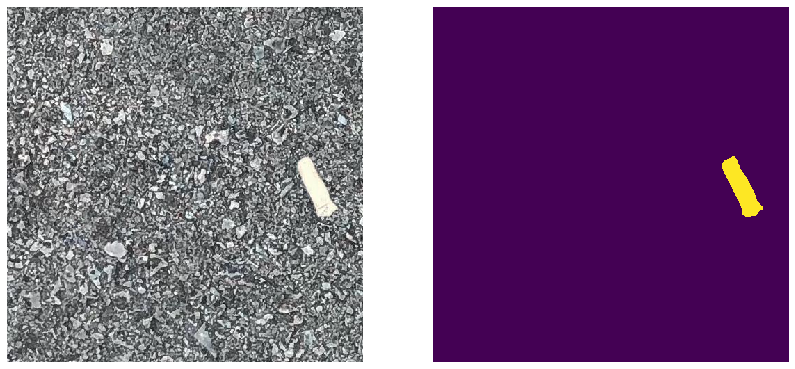

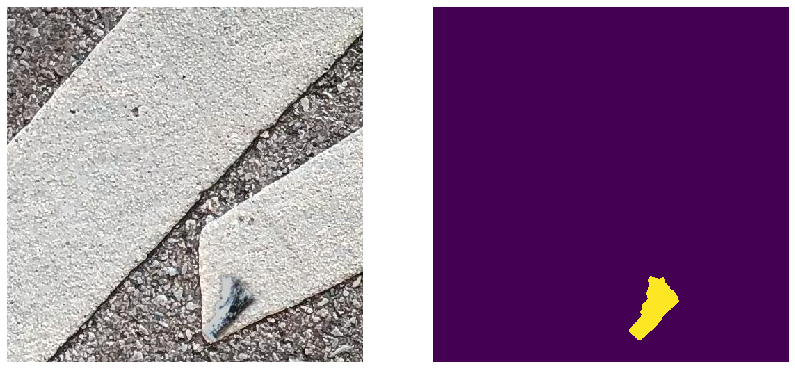

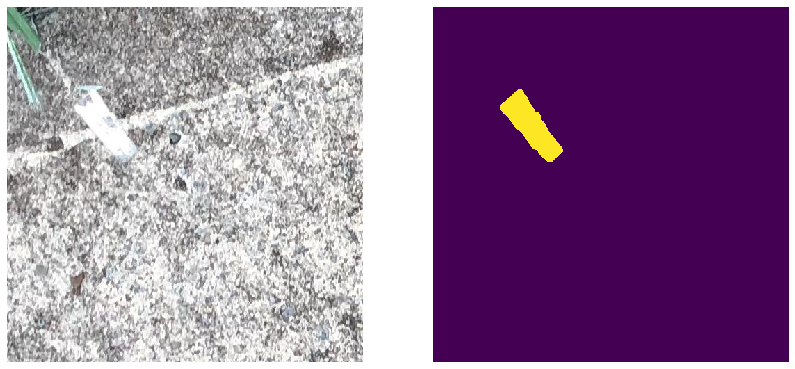

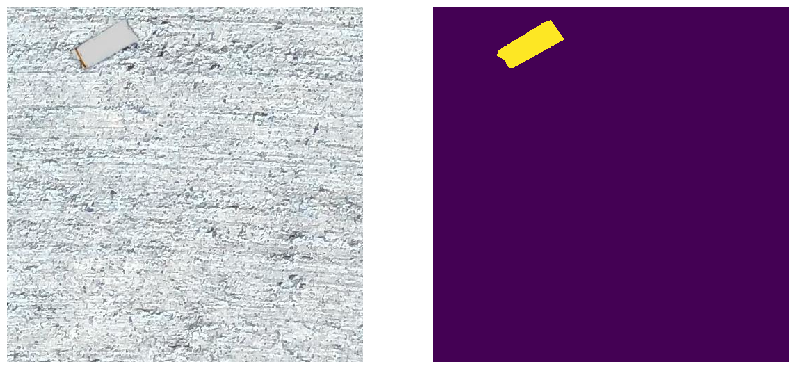

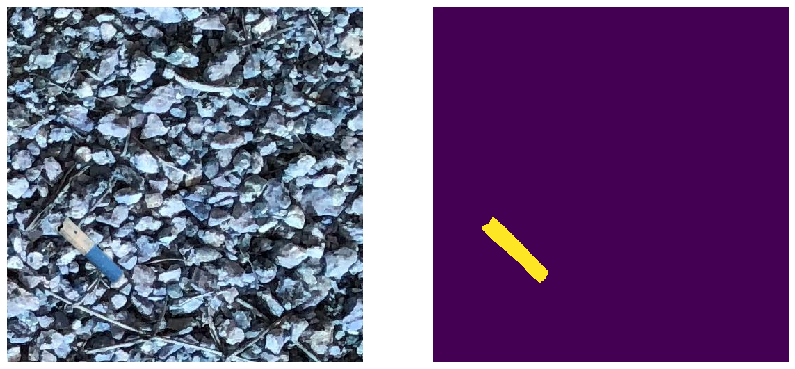

In [359]:
for i in range(12):
    show_img_with_mask(img[i], masks[i])

In [9]:
from lib.grab_cut import expected_cropped, cropped_cig

In [51]:
lst = cropped_cig((0, 1))

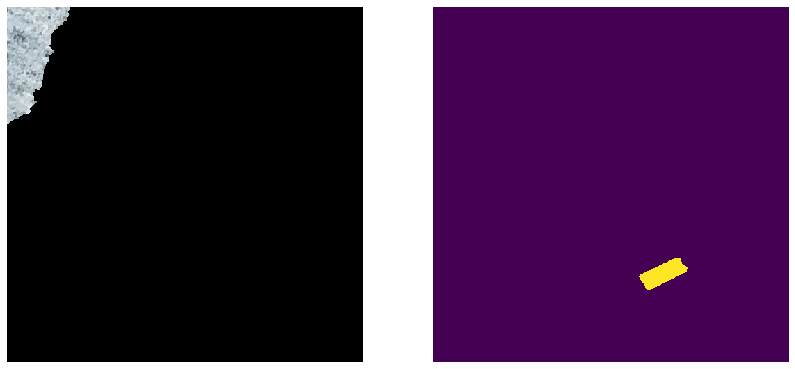

In [52]:
for i in range(1):
    show_img_with_mask(lst[i], masks[i])

In [54]:
260508**0.5 # nonzero in mask

510.399843260164

In [11]:
test = expected_cropped(11)

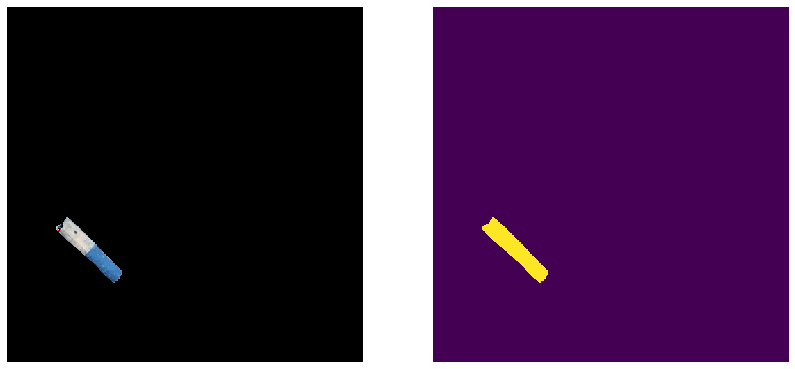

In [12]:
show_img_with_mask(test, masks[11])

In [60]:
from lib.grab_cut import expected_cropped, cropped_cig
mask = expected_cropped(mask)
show_img_with_mask(test_img[9], mask) # REDO FUNC

NameError: name 'masks' is not defined

## end test

In [98]:
rcnn_layers = model.get_trainable_layers()
load_model(dict(enumerate(rcnn_layers)))

NameError: name 'model' is not defined

In [125]:
from keras import layers
from keras import models
from keras import regularizers
from keras import optimizers
from keras.callbacks import ModelCheckpoint

def create_model():
    model = models.Sequential()
    rcnn_layers = rcnn_model.get_trainable_layers()
    for _ in rcnn_layers:
        model.add(_)
    regularizer = regularizers.l1_l2(l1=0.01, l2=0.01)
    model.add(layers.Flatten())
    model.add(layers.Dense(256, input_dim=8))
    model.add(layers.Dense(64, activation='relu',\
                   kernel_regularizer=regularizer, init='uniform'))
    
    model.add(layers.BatchNormalization(epsilon=1e-06, mode=0, momentum=0.9, weights=None))
    model.add(layers.Dropout(0.3))
    model.add(layers.Dense(1, activation='sigmoid'))
    optimizer = optimizers.SGD(lr=2e-3, decay=1e-6, momentum=0.9, nesterov=True)
    model.compile(loss='binary_crossentropy', optimizer=optimizer)
    return model

def train():
    checkpointer = ModelCheckpoint(filepath="/Mask_RCNN/mrcnn/logs/weights.h5", verbose=1, save_best_only=True)
    history = model.fit(img, masks, nb_epoch=40, batch_size=8,\
                        validation_data=(val_img, val_masks), verbose=2, callbacks=[checkpointer])

def load_trained_model(weights_path):
    model = create_model()
    model.load_weights(weights_path, by_name=True)

In [126]:
# load_trained_model(model_path)
model = create_model()

In [127]:
load_trained_model(model_path)

In [128]:
train()

ValueError: Input 0 is incompatible with layer res2a_branch1: expected axis -1 of input shape to have value 64 but got shape (None, 253, 253, 256)

### hasn't found out the way merging rcnn Config and keras Layer
### so don't have trainable network
### but have a better one - dataframe of network

In [55]:
pd.read_json(json.dumps(model.get_config().get('layers')))

,class_name,config
0,Conv2D,"{'name': 'conv1', 'trainable': True, 'filters'..."
1,BatchNorm,"{'name': 'bn_conv1', 'trainable': True, 'axis'..."
2,Conv2D,"{'name': 'res2a_branch2a', 'trainable': True, ..."
3,BatchNorm,"{'name': 'bn2a_branch2a', 'trainable': True, '..."
4,Conv2D,"{'name': 'res2a_branch2b', 'trainable': True, ..."
...,...,...
131,Flatten,"{'name': 'flatten_1', 'trainable': True, 'data..."
132,Dense,"{'name': 'dense_3', 'trainable': True, 'batch_..."
133,BatchNormalization,"{'name': 'batch_normalization_1', 'trainable':..."
134,Dropout,"{'name': 'dropout_1', 'trainable': True, 'rate..."


Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


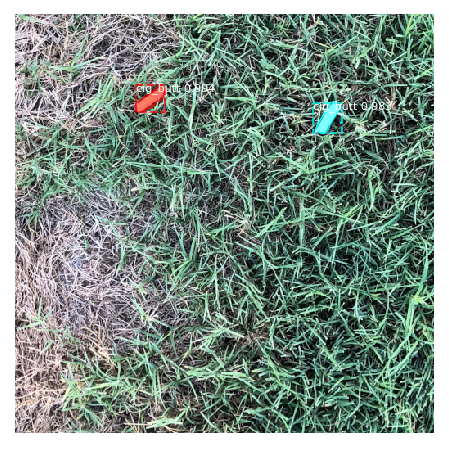

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


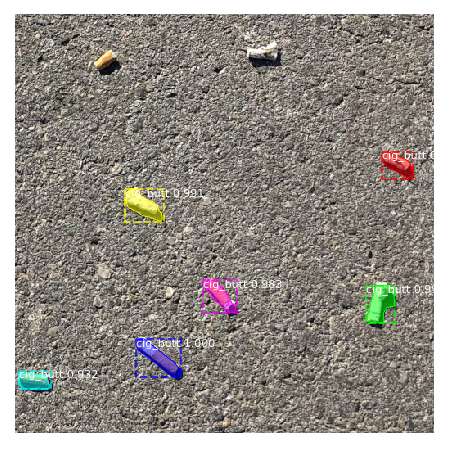

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


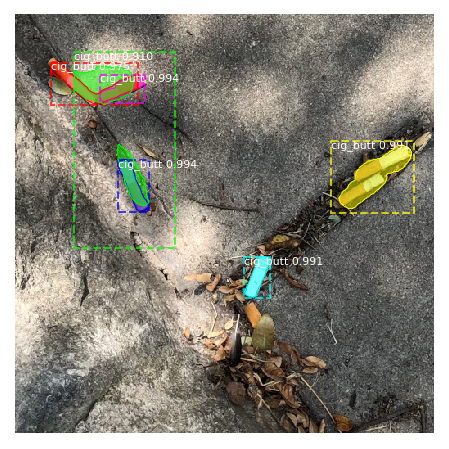

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


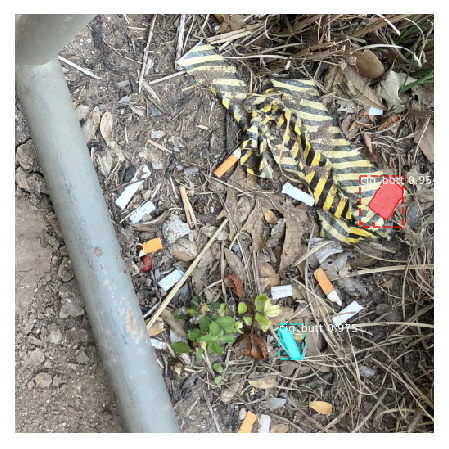

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


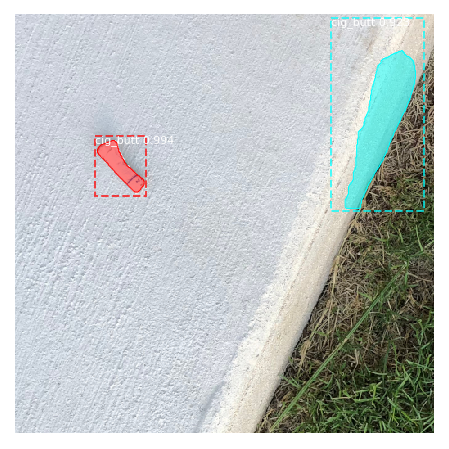

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


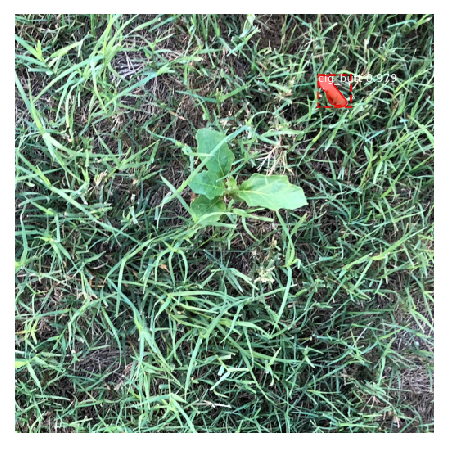

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -112.80000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


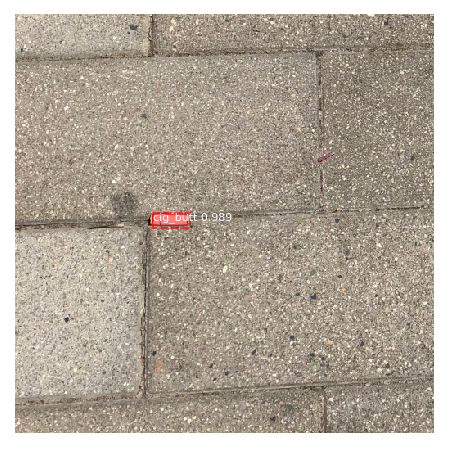

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -122.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


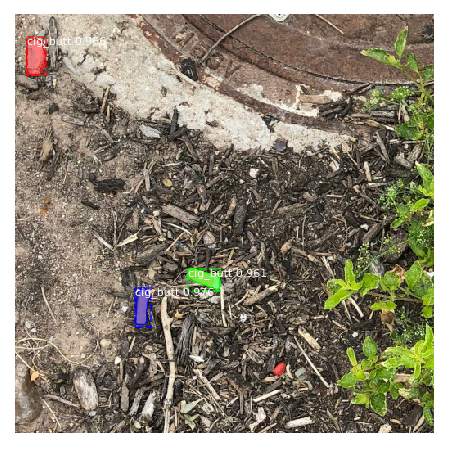

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


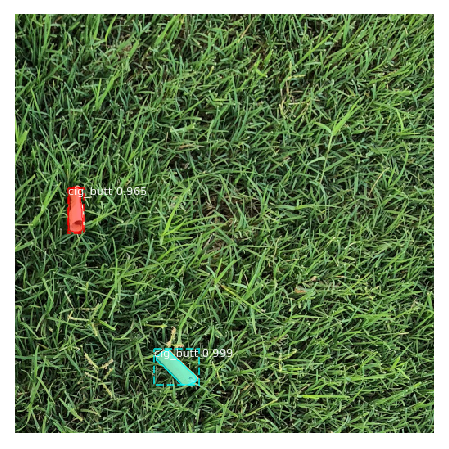

Processing 1 images
image                    shape: (512, 512, 3)         min:    0.00000  max:  255.00000  uint8
molded_images            shape: (1, 512, 512, 3)      min: -123.70000  max:  151.10000  float64
image_metas              shape: (1, 14)               min:    0.00000  max:  512.00000  int64
anchors                  shape: (1, 65472, 4)         min:   -0.17712  max:    1.05188  float32


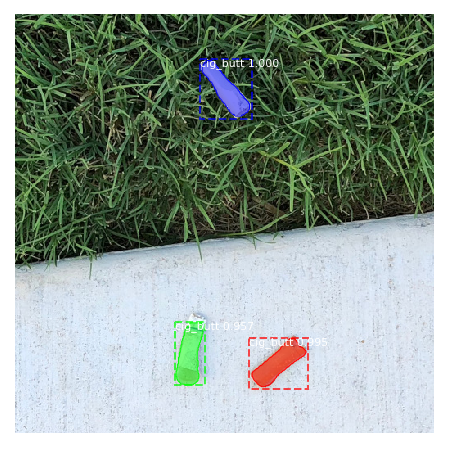

In [99]:
# import skimage

real_test_dir = 'data/cig_butts/real_test'
image_paths = []
for filename in os.listdir(real_test_dir):
    if os.path.splitext(filename)[1].lower() in ['.png', '.jpg', '.jpeg']:
        image_paths.append(os.path.join(real_test_dir, filename))

for image_path in image_paths:
    img = skimage.io.imread(image_path)
    img_arr = np.array(img)
    results = rcnn_model.detect([img_arr], verbose=1)
    r = results[0]
    visualize.display_instances(img, r['rois'], r['masks'], r['class_ids'], 
                                ['BG', 'cig_butt'], r['scores'], figsize=(8,8))

In [36]:
def cropped_cig(img, roi ,mask):
    output = []
    height, width = (512, 512)
    bgdModel = np.zeros((1,65), np.float64)
    fgdModel = np.zeros((1,65), np.float64)
    area = tuple((roi[0][1], roi[0][0], roi[0][3], roi[0][2]))
    # that was unpleasant
    mask = mask.astype('uint8')
    
    cv2.grabCut(img, mask, area, bgdModel, fgdModel, 5, cv2.GC_INIT_WITH_RECT)
    mask = np.where((mask==2)|(mask==0),0,1).astype('uint8')
    cropped_img = img * mask[:,:,np.newaxis]
    output.append(cropped_img)
        
    return np.array(output)[0]

In [37]:
test = cropped_cig(val_img[1], r['rois'], r['masks'][:,:,0].astype('uint8'))

In [202]:
np.unique(r['masks'][:,:,0].astype('uint8'))

array([0, 1], dtype=uint8)

In [277]:
r['rois']

array([[154, 104, 219, 157]], dtype=int32)

## actually still works very bad with same bg 

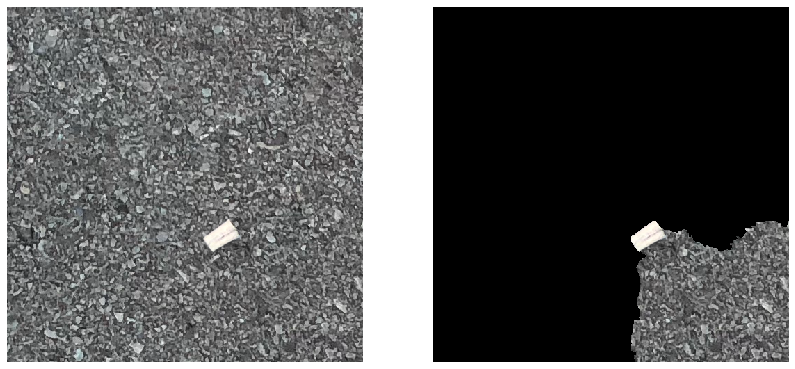

In [38]:
show_img_with_mask(val_img[1], test) # let's show what'll be

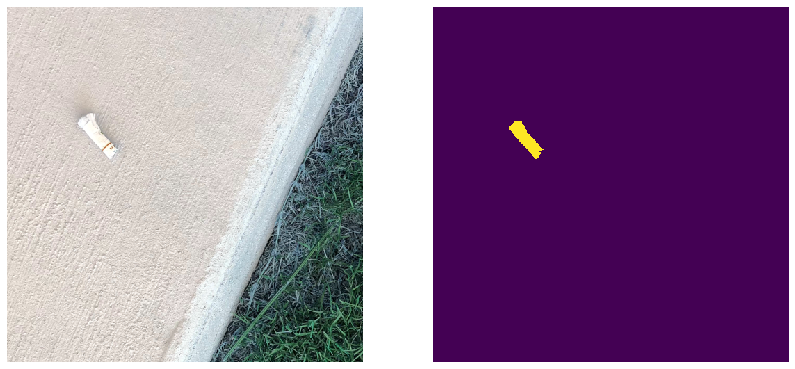

In [181]:
show_img_with_mask(test_img[4], test)